In [1]:
import matplotlib.pyplot as plt
import numpy as np
import random
import cv2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from keras.layers.merge import Concatenate
from keras.layers.core import Lambda
from keras.models import Model
from keras.models import load_model
from keras import backend as K
import tensorflow as tf
import os
from tqdm import *
from sklearn.model_selection import train_test_split
from keras.applications.vgg16 import VGG16 
from keras.applications.vgg16 import preprocess_input 
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [4]:
def read_data_new(flag, path='../../assets/brand_images'):
    """
    read the dataset，dir format must be: ./train/, ./train.txt, ./test/, ./test.txt
    :param flag: 'train' or 'test'
    """
    content = open(os.path.join(path, '%s.txt' % flag))
    
    imgs = []
    labels = []

    lines = content.readlines()
    # tqdm is the progress bar, please install it with "pip install tqdm". if u wan't, you can replace tqdm(lines) with lines.
    for i in tqdm(lines):
        fname, y = i.replace('\n', '').split(' ')
        y = int(y)
        
        x = os.path.join(path, flag, fname)
        
        imgs.append(x)
        labels.append(y)
    return imgs, labels

# 掏粪

In [5]:
xx, yy = read_data_new('train')
# list to tensor
filelist_tensor = tf.convert_to_tensor(xx, dtype=tf.string)
labellist_tensor = tf.convert_to_tensor(yy, dtype=tf.int16)

100%|████████████████████████████████████████████████████████████████████████| 2725/2725 [00:00<00:00, 160395.72it/s]


In [9]:
partitions = [0] * len(yy)
testfilesize = int(len(yy) / 5)
partitions[:testfilesize] = [1] * testfilesize
random.shuffle(partitions)

# print('partitions %s' % partitions)
# dynamic partition for split the train and test
trainfilelist, testfilelist = tf.dynamic_partition(data=filelist_tensor,
                                                  partitions=partitions,
                                                  num_partitions=2)

trainlabellist, testlabellist = tf.dynamic_partition(data=labellist_tensor,
                                                    partitions=partitions,
                                                    num_partitions=2)

In [10]:
# image width and height
IMG_WIDTH = 600
IMG_HEIGHT = 300

def image_operate(input_queue):
    """
    image operattions consist of file name to img, resize
    """
    label = input_queue[1]
    # get contents from file
    print('image name', input_queue[0])
    contents = tf.read_file(input_queue[0])
    # decode image by its format
    image = tf.image.decode_jpeg(contents)
    # resize size argument must be [width, height]
    image = tf.image.resize_images(images=image,
                                   size=[IMG_WIDTH, IMG_HEIGHT])
    image = tf.reshape(image, tf.stack([IMG_WIDTH, IMG_HEIGHT, 3]))

    return image, label


In [13]:
# 一批一批切
train_input_queue = tf.train.slice_input_producer(tensor_list=[trainfilelist, trainlabellist],
                                                  shuffle=False,  # whether shuffle the data
                                                  num_epochs=1  # determines the number of times to output total data
                                                 )

In [14]:
train_x, train_y = image_operate(train_input_queue)

image name Tensor("input_producer_1/GatherV2:0", shape=(), dtype=string)


In [15]:
# batch size 
BATCH_SIZE = 20

train_batch = tf.train.batch(tensors=[train_x , train_y], 
                             batch_size=BATCH_SIZE,
                             num_threads=2,
                            )
train_batch

[<tf.Tensor 'batch:0' shape=(20, 600, 300, 3) dtype=float32>,
 <tf.Tensor 'batch:1' shape=(20,) dtype=int16>]

batch 1 [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] (20, 600, 300, 3)


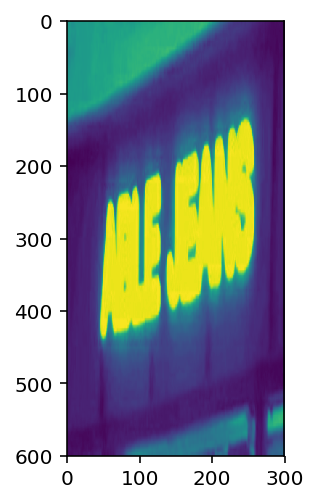

batch 2 [1 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2] (20, 600, 300, 3)


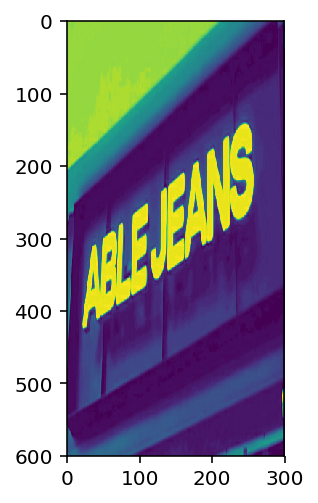

batch 3 [2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3] (20, 600, 300, 3)


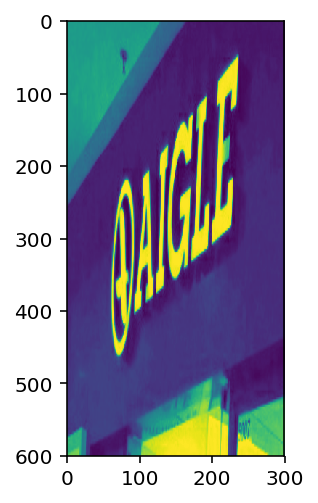

batch 4 [3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4] (20, 600, 300, 3)


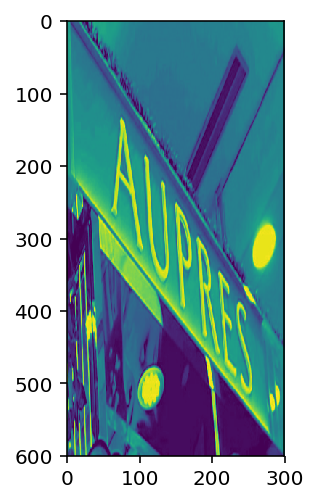

batch 5 [4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5] (20, 600, 300, 3)


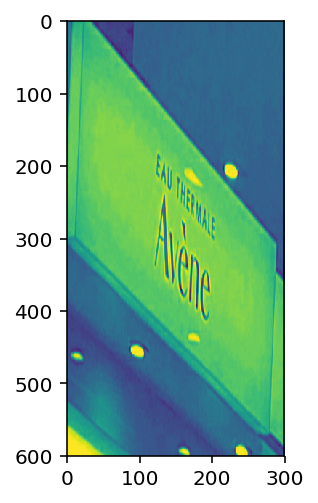

batch 6 [5 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6] (20, 600, 300, 3)


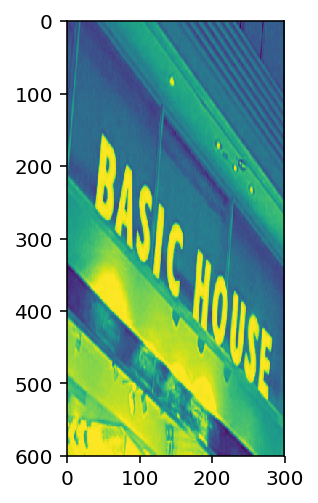

batch 7 [6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6] (20, 600, 300, 3)


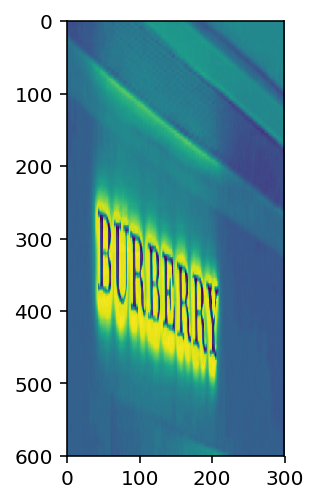

batch 8 [6 6 6 6 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7] (20, 600, 300, 3)


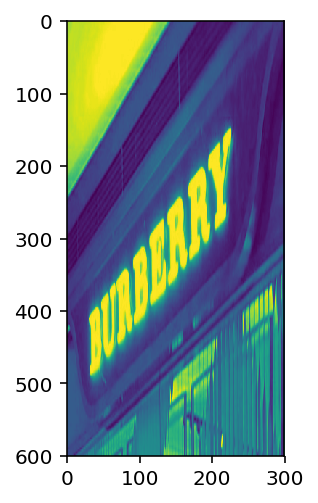

batch 9 [7 7 8 7 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8] (20, 600, 300, 3)


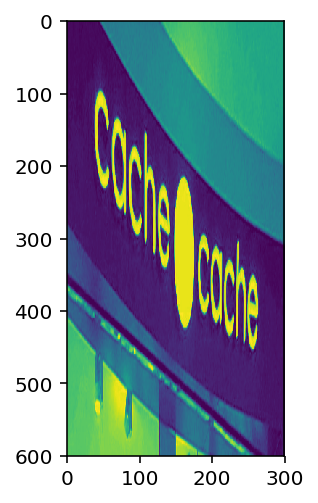

batch 10 [8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 9 9 9 9] (20, 600, 300, 3)


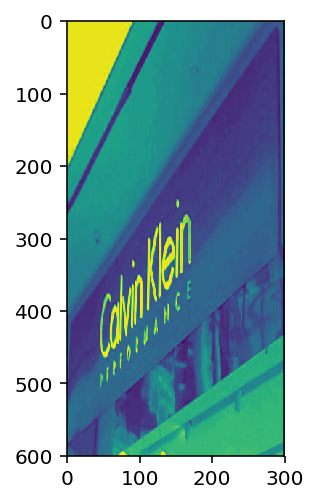

batch 11 [ 9  9  9  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10 10 10] (20, 600, 300, 3)


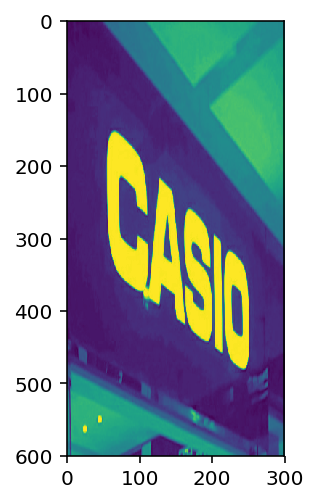

batch 12 [10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10] (20, 600, 300, 3)


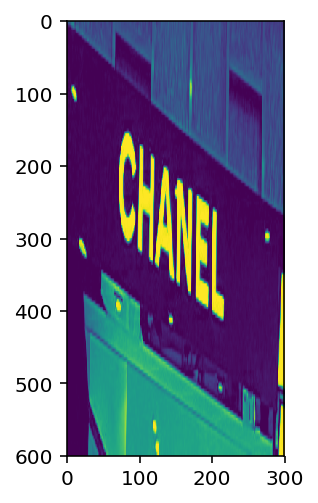

batch 13 [10 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11] (20, 600, 300, 3)


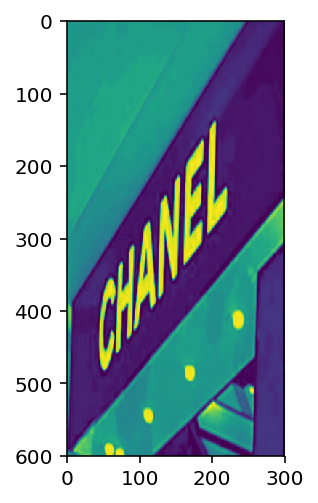

batch 14 [11 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12 12 12 12] (20, 600, 300, 3)


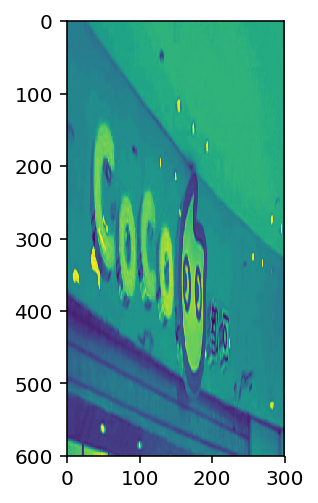

batch 15 [12 12 12 12 12 12 12 12 12 12 12 12 12 12 13 13 13 13 13 13] (20, 600, 300, 3)


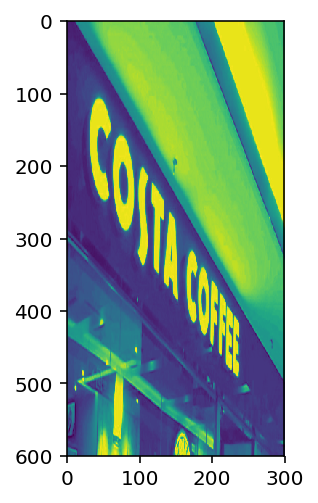

batch 16 [13 13 13 13 13 13 13 13 13 13 13 13 14 14 14 14 14 14 14 14] (20, 600, 300, 3)


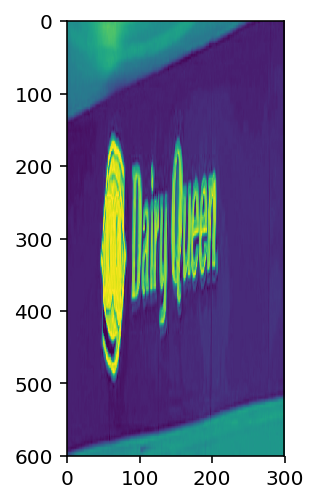

batch 17 [14 14 14 14 14 14 15 15 15 15 15 15 15 15 15 15 15 15 15 15] (20, 600, 300, 3)


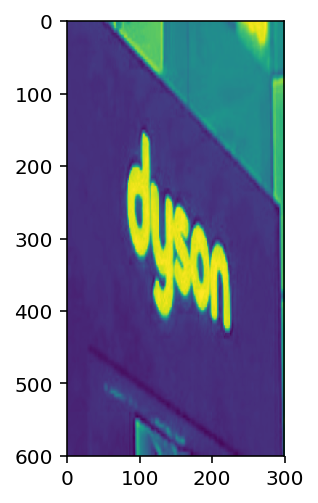

batch 18 [15 15 15 15 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16] (20, 600, 300, 3)


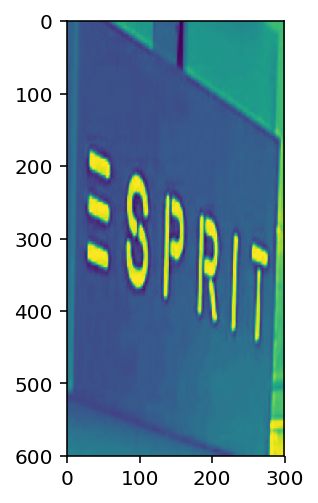

batch 19 [16 16 16 16 16 16 17 17 17 17 17 17 17 17 17 17 17 17 17 17] (20, 600, 300, 3)


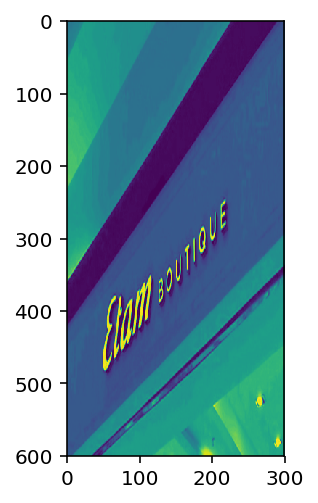

batch 20 [17 17 17 17 17 17 17 18 18 18 18 18 18 18 18 18 18 18 18 18] (20, 600, 300, 3)


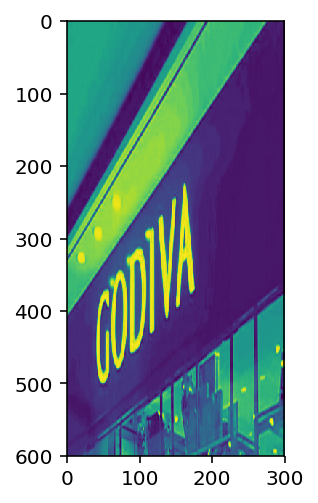

batch 21 [18 18 18 18 18 18 18 19 19 19 19 19 19 19 19 19 19 19 19 19] (20, 600, 300, 3)


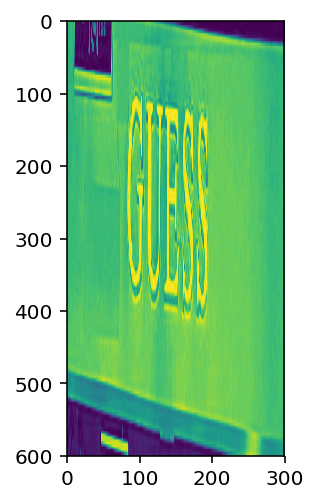

batch 22 [19 19 19 19 19 19 19 20 20 20 20 20 20 20 20 20 20 20 20 20] (20, 600, 300, 3)


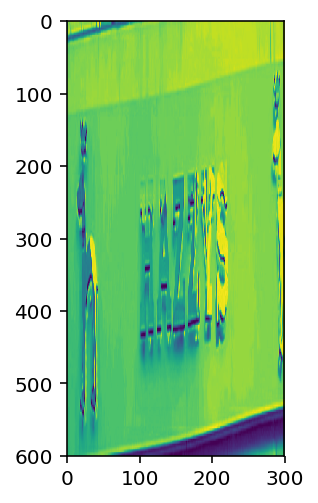

batch 23 [20 20 20 20 20 20 20 21 21 21 21 21 21 21 21 21 21 21 21 21] (20, 600, 300, 3)


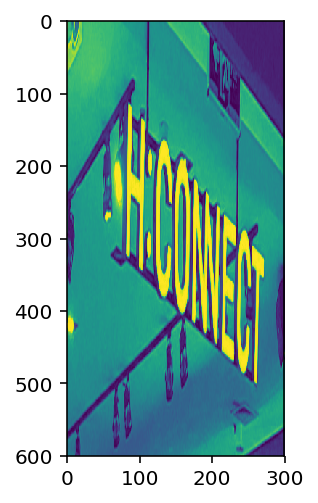

batch 24 [21 21 21 21 21 21 21 21 22 22 22 22 22 22 22 22 22 22 22 22] (20, 600, 300, 3)


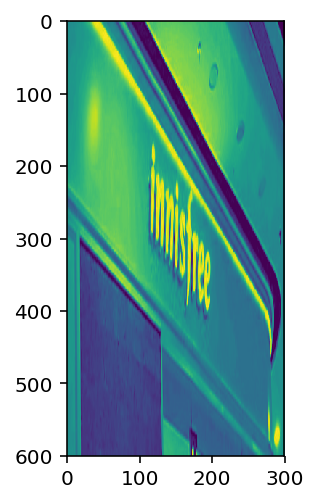

batch 25 [22 22 22 22 22 22 22 23 22 23 23 23 23 23 23 23 23 23 23 23] (20, 600, 300, 3)


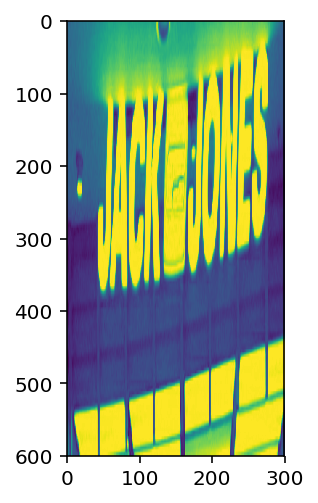

batch 26 [23 23 23 23 23 23 24 24 24 24 24 24 24 24 24 24 24 24 24 24] (20, 600, 300, 3)


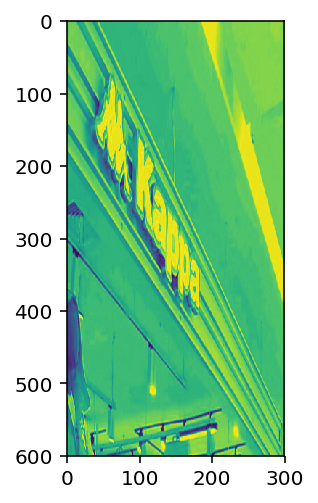

batch 27 [24 24 24 24 24 25 25 25 25 25 25 25 25 25 25 25 25 25 25 25] (20, 600, 300, 3)


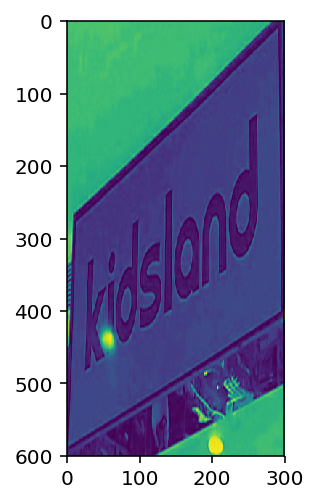

batch 28 [25 25 25 25 25 25 25 25 25 25 25 25 26 26 26 26 26 26 26 26] (20, 600, 300, 3)


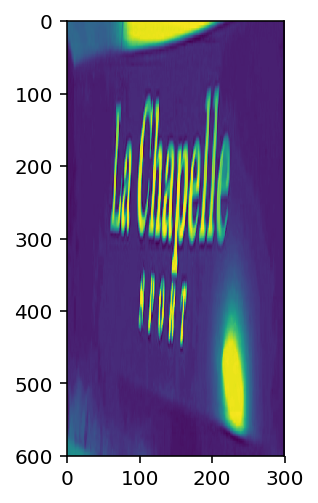

batch 29 [26 26 26 26 26 26 26 26 26 26 26 26 27 27 27 27 27 27 27 27] (20, 600, 300, 3)


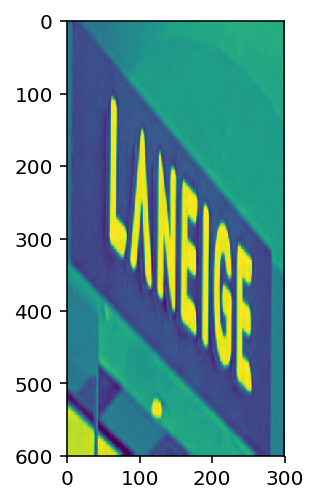

batch 30 [27 27 27 27 27 27 27 27 27 27 27 27 27 27 28 28 28 28 28 28] (20, 600, 300, 3)


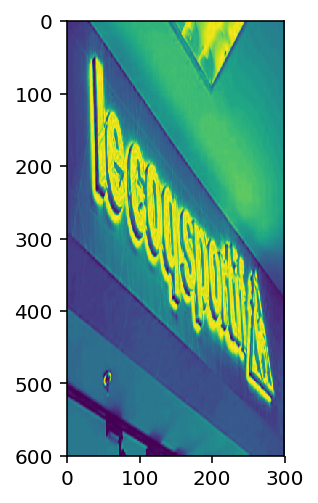

batch 31 [28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 28 29] (20, 600, 300, 3)


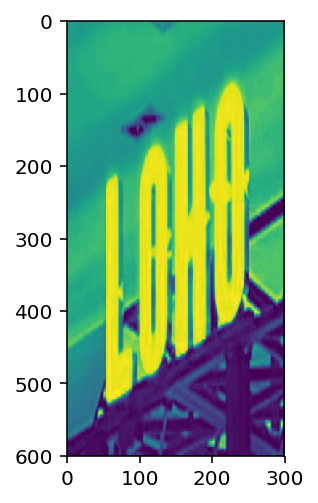

batch 32 [29 29 29 29 29 29 29 29 29 29 29 29 29 29 29 29 30 30 30 30] (20, 600, 300, 3)


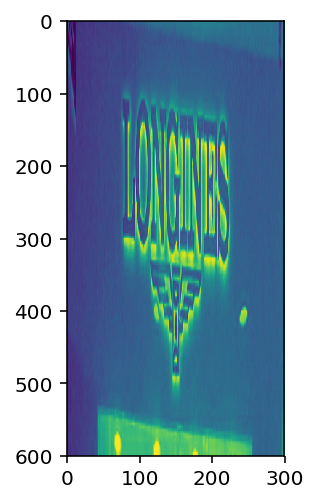

batch 33 [30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 31 31 31] (20, 600, 300, 3)


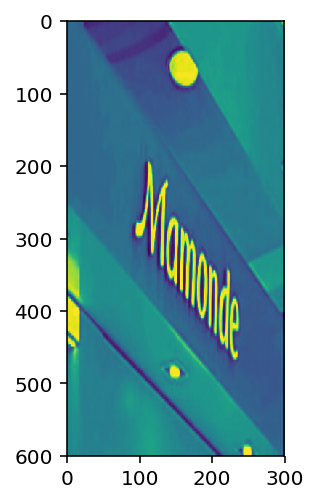

batch 34 [31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 31 32] (20, 600, 300, 3)


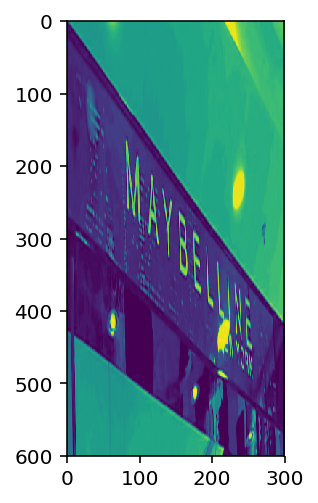

batch 35 [32 32 32 32 32 32 32 32 32 32 32 32 33 33 33 33 33 33 33 33] (20, 600, 300, 3)


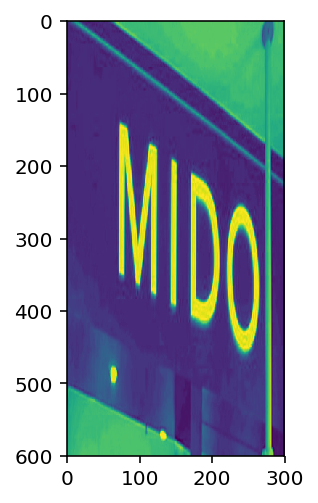

batch 36 [33 33 33 33 33 33 33 33 33 33 33 34 34 34 34 34 34 34 34 34] (20, 600, 300, 3)


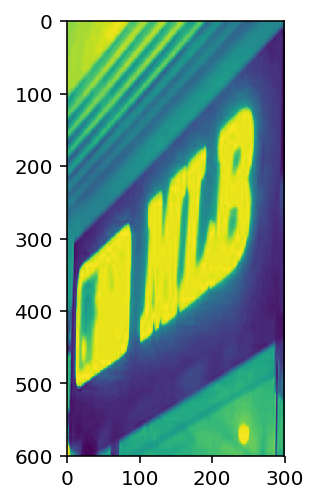

batch 37 [34 34 34 34 35 34 35 35 35 35 35 35 35 35 35 35 35 35 35 35] (20, 600, 300, 3)


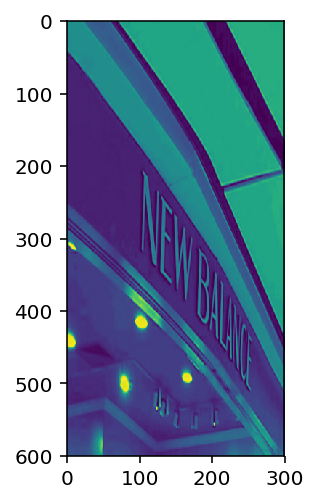

batch 38 [35 35 35 35 35 35 36 36 36 36 36 36 36 36 36 36 36 36 36 36] (20, 600, 300, 3)


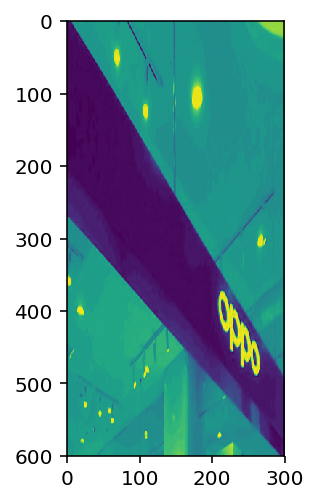

batch 39 [36 36 36 36 36 36 37 37 37 37 37 37 37 37 37 37 37 37 37 37] (20, 600, 300, 3)


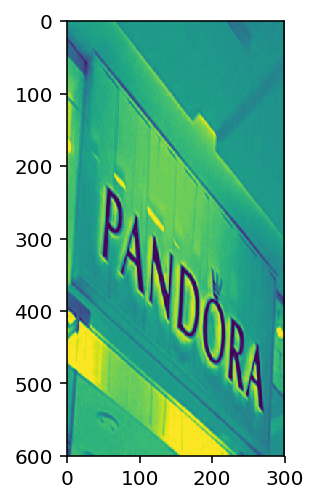

batch 40 [37 37 37 37 37 37 37 38 38 38 38 38 38 38 38 38 38 38 38 38] (20, 600, 300, 3)


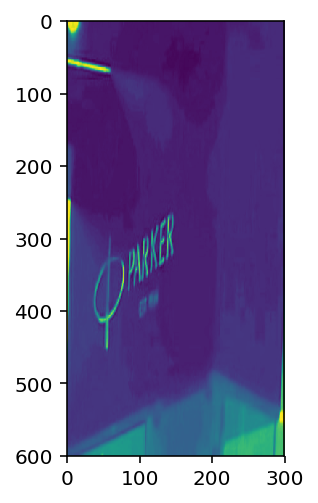

batch 41 [38 38 38 38 39 38 39 39 39 39 39 39 39 39 39 39 39 39 39 39] (20, 600, 300, 3)


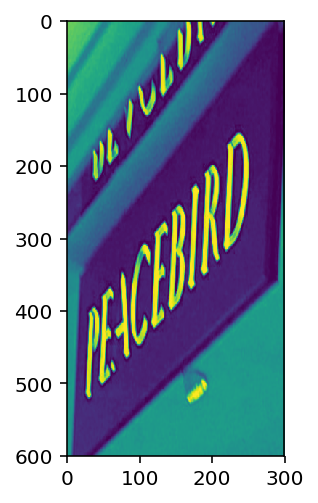

batch 42 [39 39 39 39 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40 40] (20, 600, 300, 3)


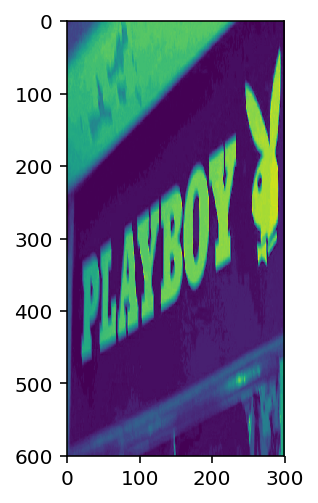

batch 43 [40 40 40 40 41 40 41 41 41 41 41 41 41 41 41 41 41 41 41 41] (20, 600, 300, 3)


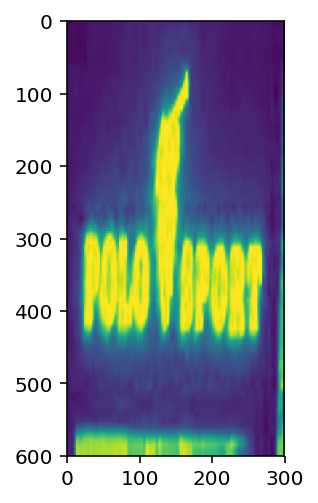

batch 44 [41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 41 42 42] (20, 600, 300, 3)


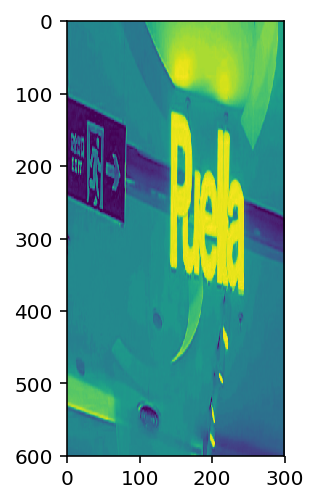

batch 45 [42 42 42 42 42 42 42 42 42 42 43 43 43 43 43 43 43 43 43 43] (20, 600, 300, 3)


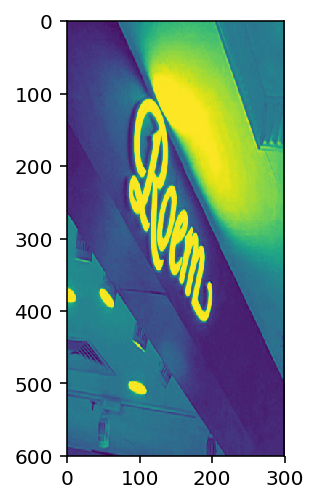

batch 46 [43 43 43 43 43 43 43 44 44 44 44 44 44 44 44 44 44 44 44 44] (20, 600, 300, 3)


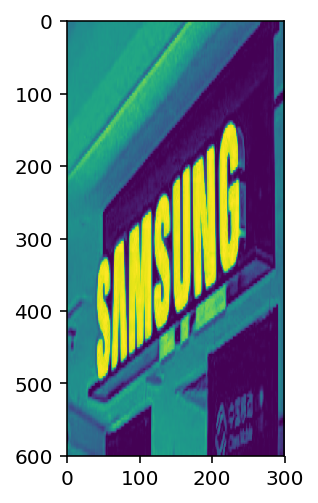

batch 47 [44 44 44 44 44 44 44 44 44 45 45 45 45 45 45 45 45 45 45 45] (20, 600, 300, 3)


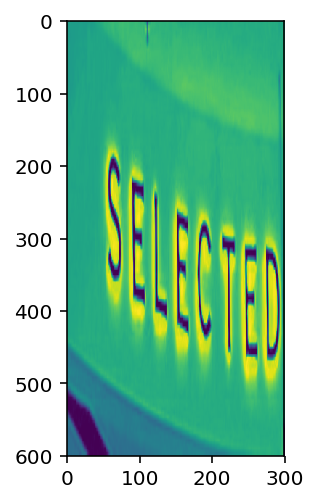

batch 48 [45 45 45 45 45 45 45 45 45 45 46 46 46 46 46 46 46 46 46 46] (20, 600, 300, 3)


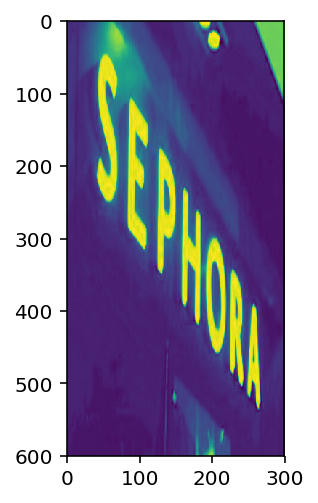

batch 49 [46 46 46 46 46 46 46 46 46 46 46 46 47 47 47 47 47 47 47 47] (20, 600, 300, 3)


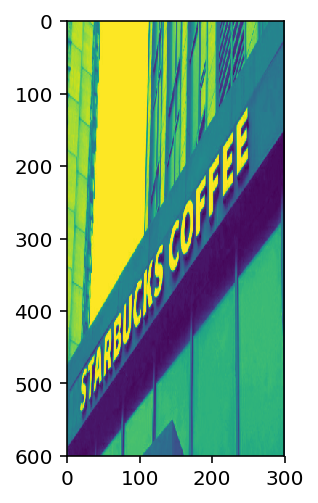

batch 50 [47 47 47 47 47 47 47 47 47 47 47 47 47 47 48 48 48 48 48 48] (20, 600, 300, 3)


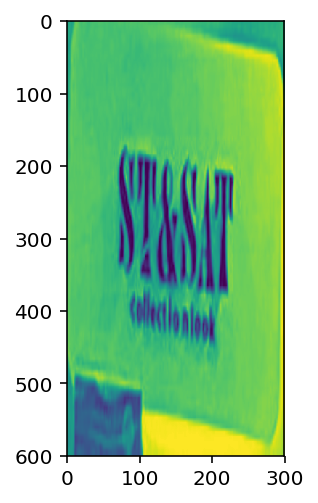

batch 51 [48 48 48 48 48 48 48 48 48 48 48 48 48 49 49 49 49 49 49 49] (20, 600, 300, 3)


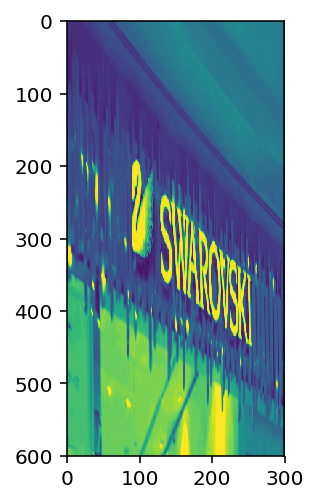

batch 52 [49 49 49 49 49 49 49 49 49 49 49 49 50 50 50 50 50 50 50 50] (20, 600, 300, 3)


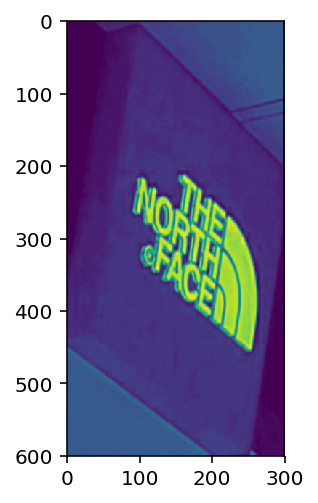

batch 53 [50 50 50 50 50 50 50 50 50 50 51 51 51 51 51 51 51 51 51 51] (20, 600, 300, 3)


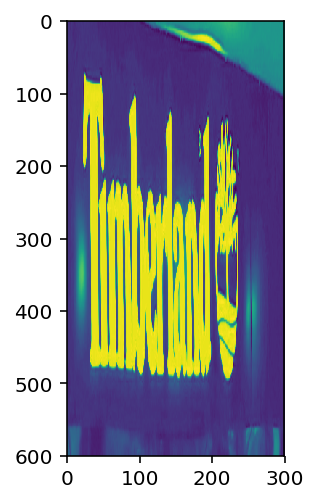

batch 54 [51 51 51 51 51 51 51 51 51 52 52 52 52 52 52 52 52 52 52 52] (20, 600, 300, 3)


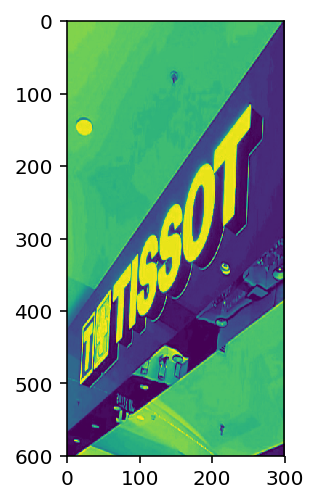

batch 55 [52 52 52 52 52 52 52 52 52 52 52 52 53 53 53 53 53 53 53 53] (20, 600, 300, 3)


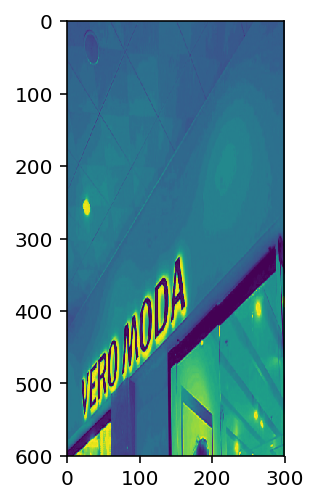

batch 56 [53 53 53 53 53 53 53 53 53 53 54 54 54 54 54 54 54 54 54 54] (20, 600, 300, 3)


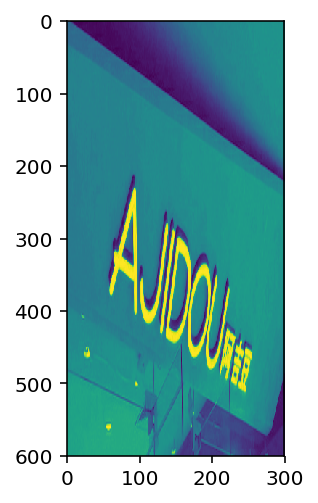

batch 57 [54 54 54 54 54 54 54 54 54 54 54 54 54 55 55 55 55 55 55 55] (20, 600, 300, 3)


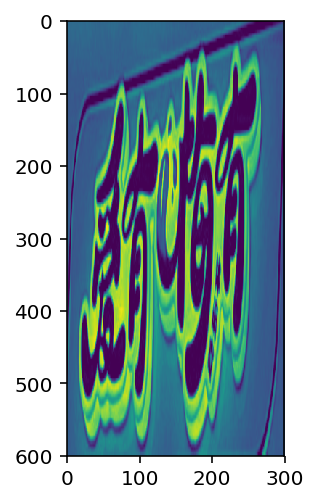

batch 58 [55 55 55 55 55 55 55 55 55 55 55 55 55 55 55 55 55 55 55 55] (20, 600, 300, 3)


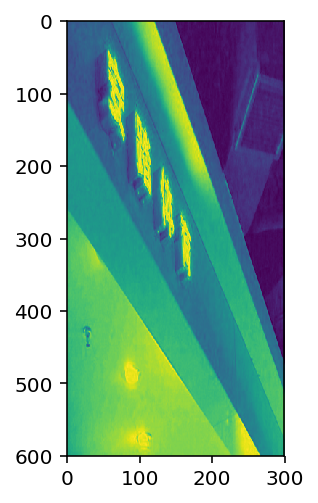

batch 59 [55 55 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56] (20, 600, 300, 3)


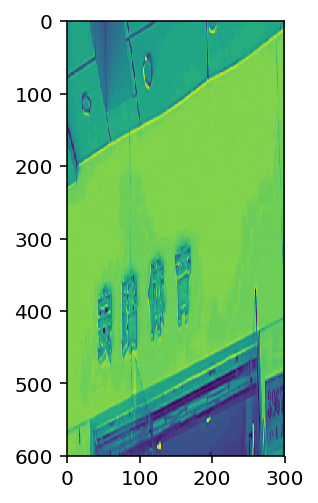

batch 60 [56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56 56] (20, 600, 300, 3)


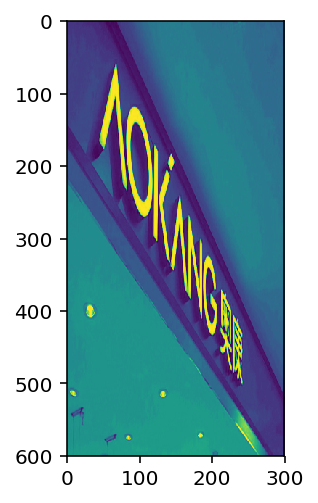

batch 61 [56 56 56 56 56 56 56 56 57 57 57 57 57 57 57 57 57 57 57 57] (20, 600, 300, 3)


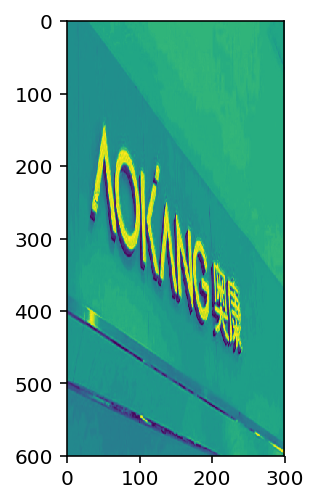

batch 62 [57 57 57 57 57 57 57 57 57 57 57 57 57 57 58 58 58 58 58 58] (20, 600, 300, 3)


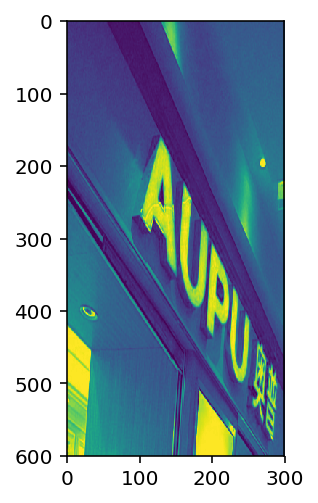

batch 63 [58 58 58 58 58 58 58 58 58 58 58 58 58 58 58 58 58 58 58 58] (20, 600, 300, 3)


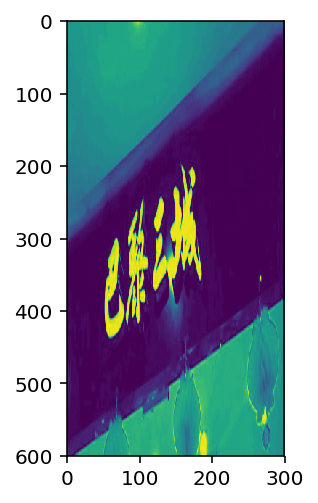

batch 64 [58 59 59 59 59 59 59 59 59 59 59 59 59 59 59 59 59 59 59 59] (20, 600, 300, 3)


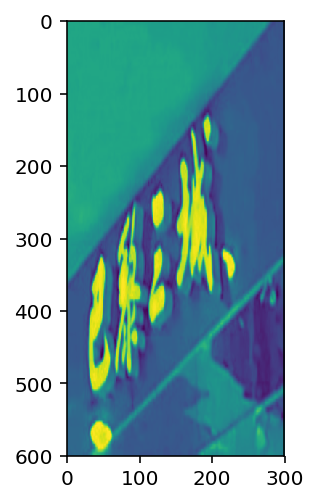

batch 65 [59 59 59 59 59 59 59 59 60 60 60 60 60 60 60 60 60 60 60 60] (20, 600, 300, 3)


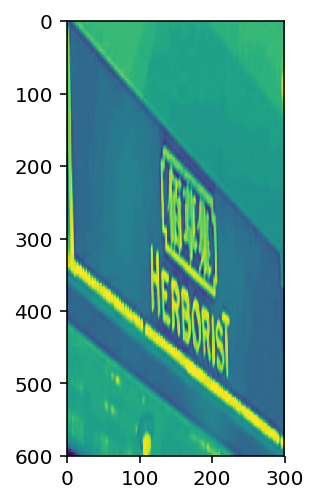

batch 66 [60 60 60 60 60 60 60 60 60 60 60 60 61 61 61 61 61 61 61 61] (20, 600, 300, 3)


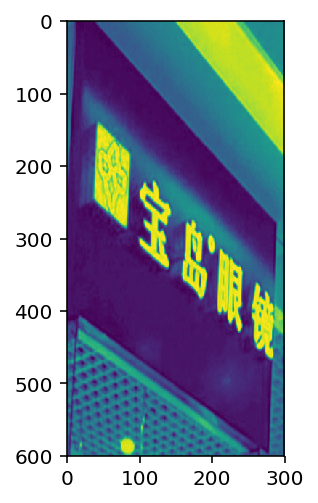

batch 67 [61 61 61 61 61 61 61 61 61 61 61 61 61 61 61 61 61 62 62 62] (20, 600, 300, 3)


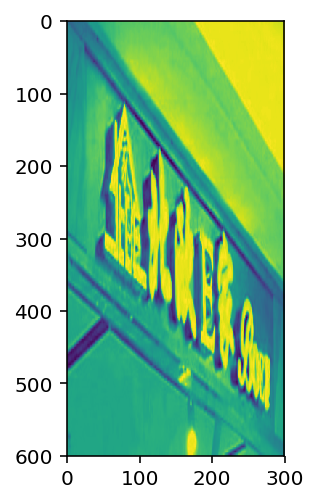

batch 68 [62 62 62 62 62 62 62 62 62 62 62 62 62 62 62 62 62 62 62 62] (20, 600, 300, 3)


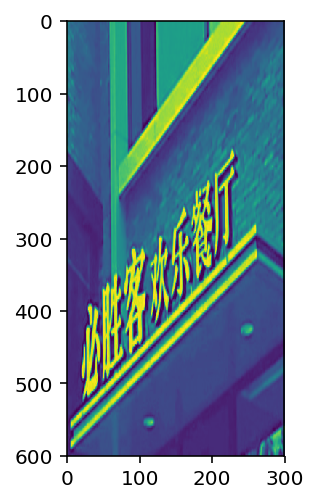

batch 69 [62 62 62 62 62 62 62 62 62 62 62 62 62 62 62 62 63 63 63 63] (20, 600, 300, 3)


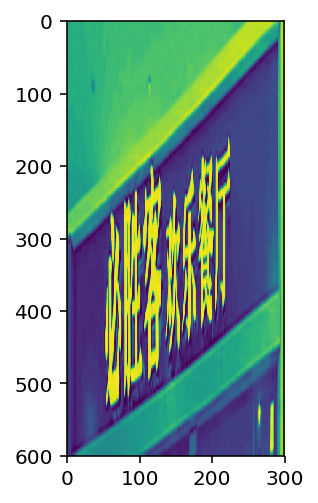

batch 70 [63 63 63 63 63 63 63 63 63 63 63 63 63 63 63 63 63 63 63 63] (20, 600, 300, 3)


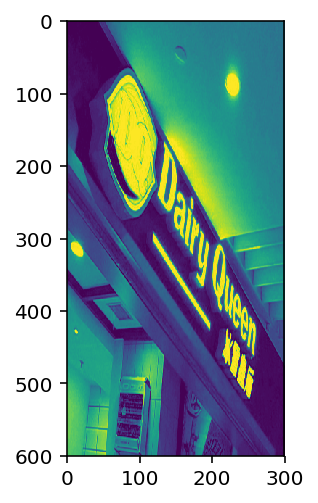

batch 71 [63 63 63 63 63 63 63 64 63 64 64 64 64 64 64 64 64 64 64 64] (20, 600, 300, 3)


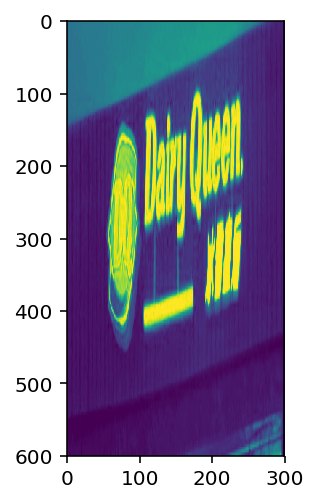

batch 72 [64 64 64 64 64 64 64 64 64 64 64 64 64 64 64 64 64 64 64 64] (20, 600, 300, 3)


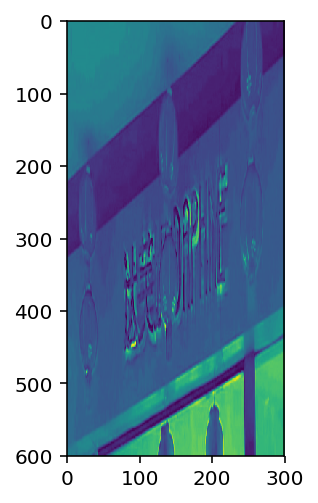

batch 73 [65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 66 66 66] (20, 600, 300, 3)


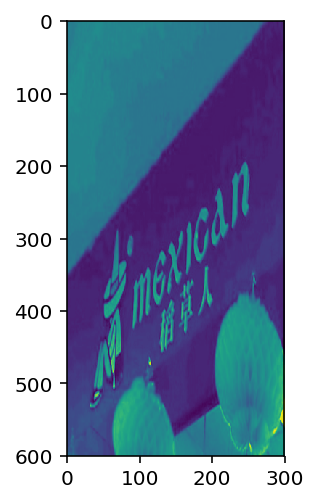

batch 74 [66 66 66 66 66 66 66 66 66 66 66 66 66 66 66 66 66 66 66 66] (20, 600, 300, 3)


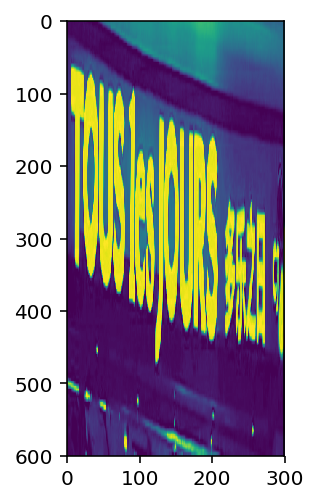

batch 75 [66 66 66 66 67 67 67 67 67 67 67 67 67 67 67 67 67 68 68 68] (20, 600, 300, 3)


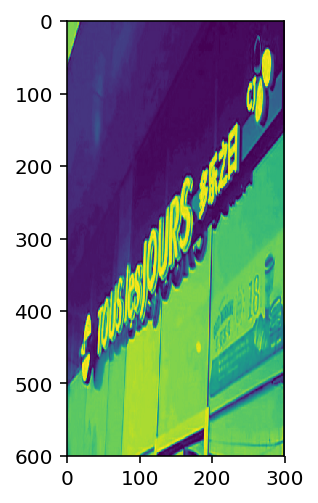

batch 76 [68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 69 69 69 68] (20, 600, 300, 3)


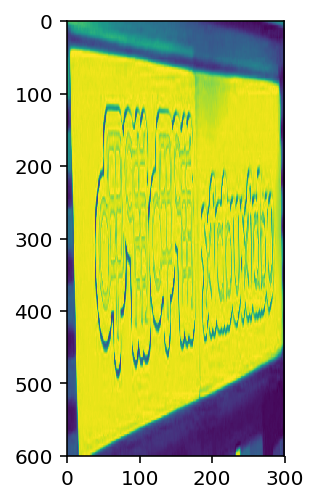

batch 77 [69 69 69 69 69 69 69 69 69 70 70 70 70 70 70 70 70 70 70 70] (20, 600, 300, 3)


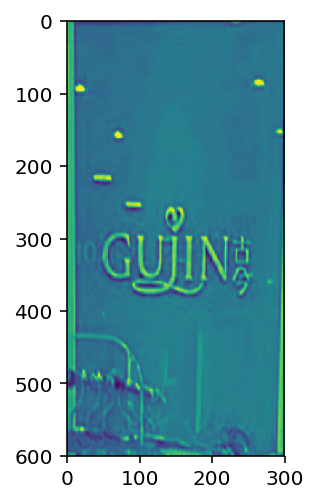

batch 78 [70 70 70 70 71 71 71 71 71 71 71 71 71 71 71 71 71 71 71 71] (20, 600, 300, 3)


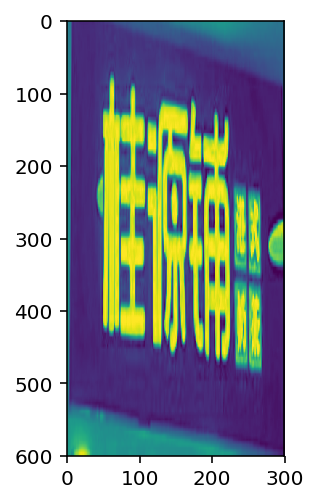

batch 79 [71 72 72 72 72 72 72 72 72 72 72 72 72 72 73 72 73 73 73 73] (20, 600, 300, 3)


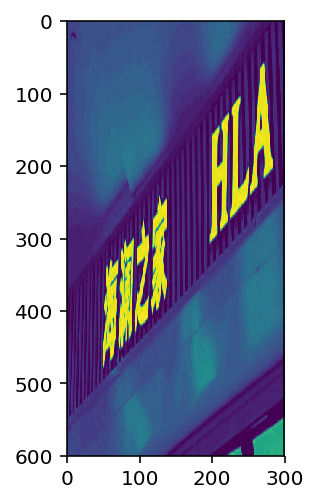

batch 80 [73 73 73 73 73 73 73 73 73 73 73 74 74 74 74 74 74 74 74 74] (20, 600, 300, 3)


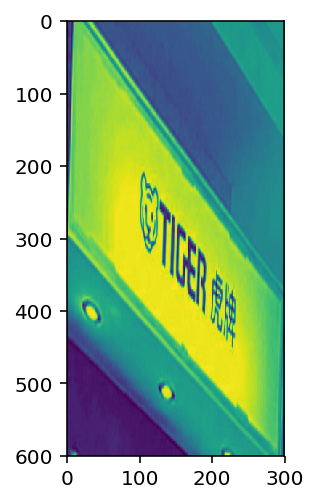

batch 81 [74 74 74 74 74 74 75 75 75 75 75 75 75 75 75 75 75 75 75 75] (20, 600, 300, 3)


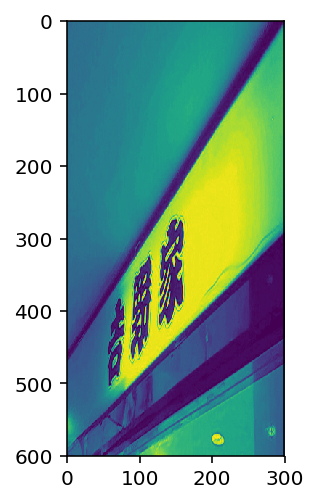

batch 82 [75 75 76 76 76 76 76 76 76 76 76 76 76 76 76 76 76 76 76 76] (20, 600, 300, 3)


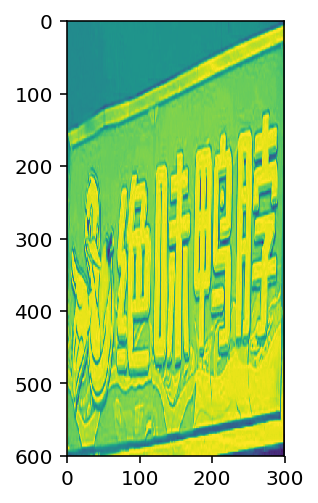

batch 83 [76 76 76 76 76 76 76 76 77 77 77 77 77 77 77 77 77 77 77 77] (20, 600, 300, 3)


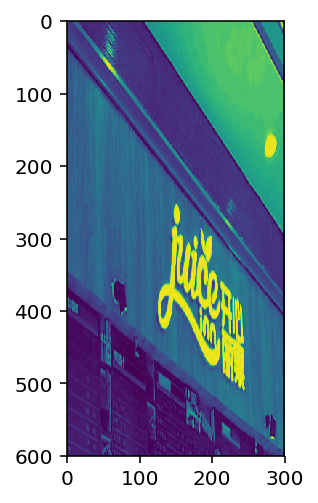

batch 84 [77 77 78 77 78 78 78 78 78 78 78 78 78 78 78 78 78 78 78 78] (20, 600, 300, 3)


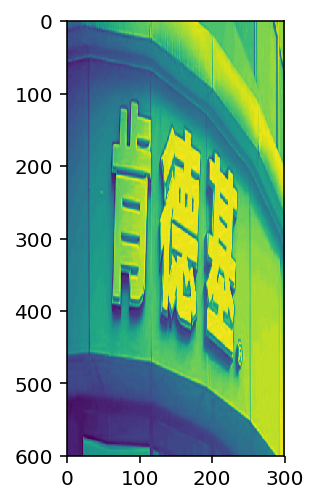

batch 85 [78 78 78 78 78 78 78 78 79 79 79 79 79 79 79 79 79 79 79 79] (20, 600, 300, 3)


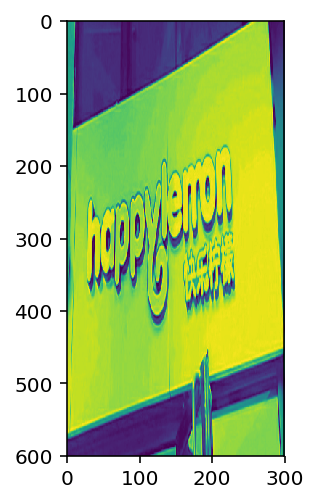

batch 86 [79 79 79 79 79 79 79 79 79 79 79 79 79 79 79 80 80 80 80 80] (20, 600, 300, 3)


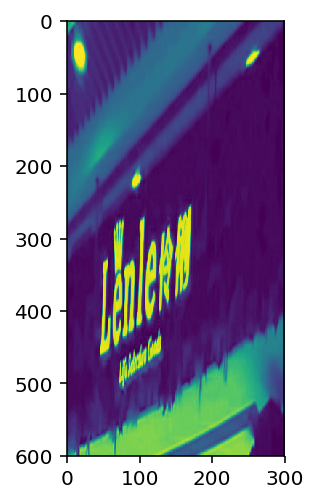

batch 87 [80 80 80 80 80 80 80 80 80 81 81 81 81 81 81 81 81 81 81 81] (20, 600, 300, 3)


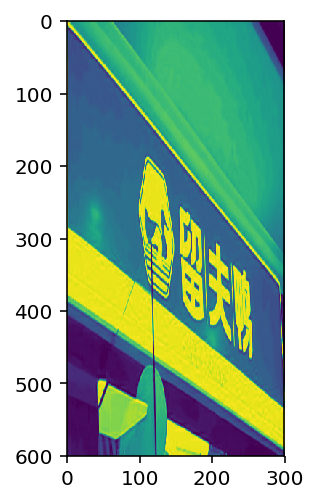

batch 88 [81 81 81 81 81 81 81 81 81 81 81 82 82 82 82 82 82 82 82 82] (20, 600, 300, 3)


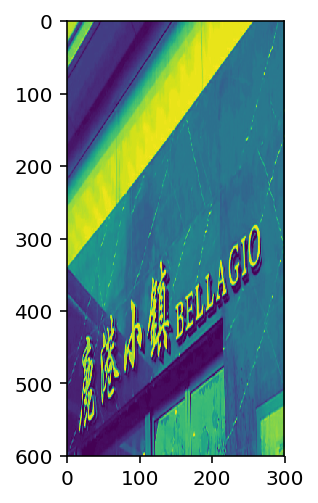

batch 89 [82 82 82 82 82 82 82 82 82 82 82 82 82 83 83 83 83 83 83 83] (20, 600, 300, 3)


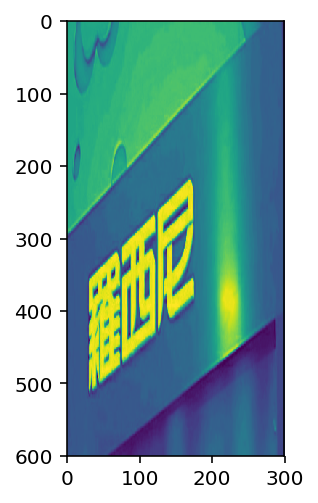

batch 90 [83 83 83 83 83 83 83 83 83 83 83 84 84 84 84 84 84 84 84 84] (20, 600, 300, 3)


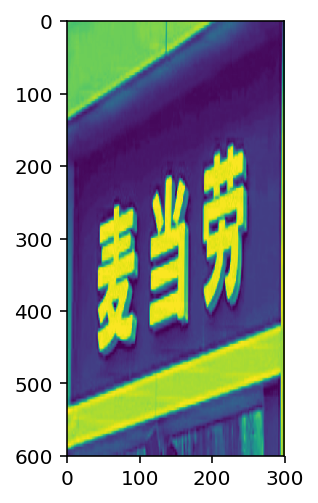

batch 91 [84 84 84 84 84 84 84 84 84 85 84 85 85 85 85 85 85 85 85 85] (20, 600, 300, 3)


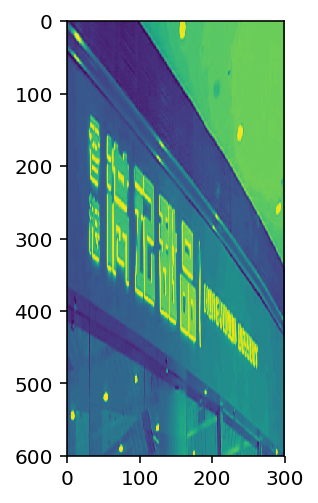

batch 92 [85 85 85 86 86 86 86 86 86 86 86 86 86 86 86 86 86 86 86 86] (20, 600, 300, 3)


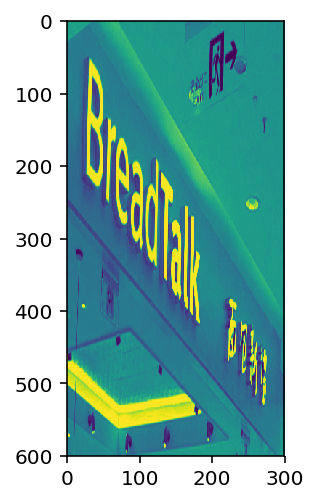

batch 93 [86 86 86 86 86 86 86 86 86 86 86 86 87 87 87 87 87 87 87 87] (20, 600, 300, 3)


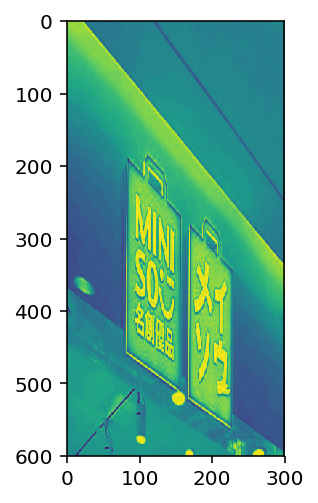

batch 94 [87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 87 88 87 88] (20, 600, 300, 3)


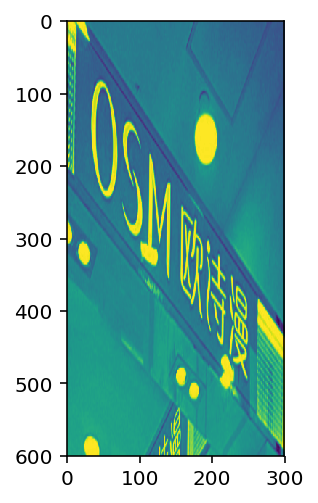

batch 95 [88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 88 89] (20, 600, 300, 3)


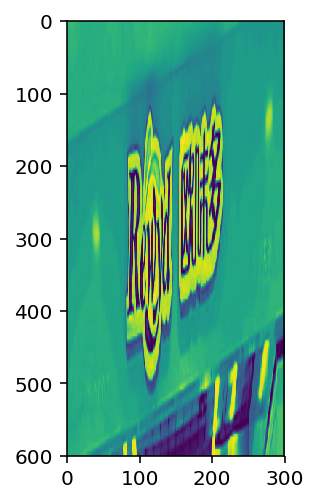

batch 96 [89 89 89 89 89 89 89 89 89 89 89 89 89 89 89 89 89 89 90 90] (20, 600, 300, 3)


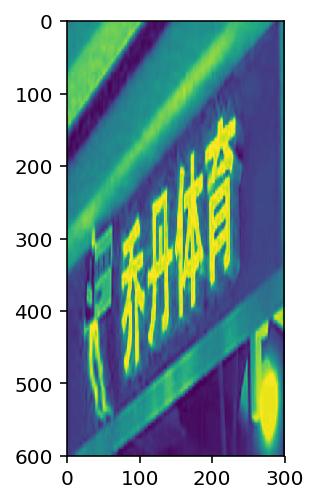

batch 97 [90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 91] (20, 600, 300, 3)


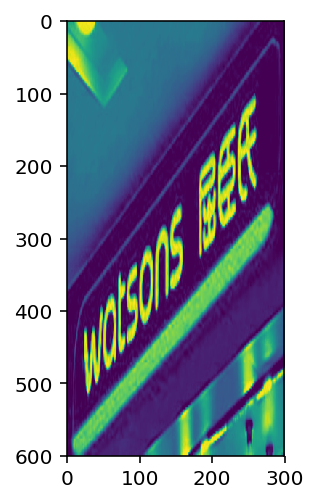

batch 98 [91 91 91 91 91 91 91 91 91 91 91 91 91 92 92 92 92 92 92 92] (20, 600, 300, 3)


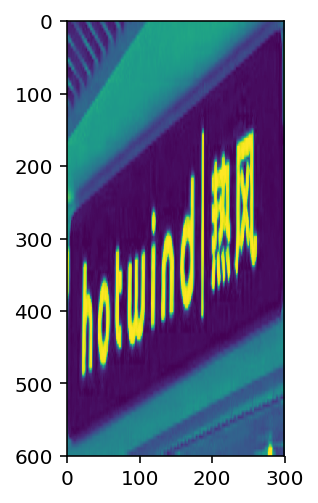

batch 99 [92 92 92 92 92 92 92 92 92 92 92 92 92 92 92 93 93 93 93 93] (20, 600, 300, 3)


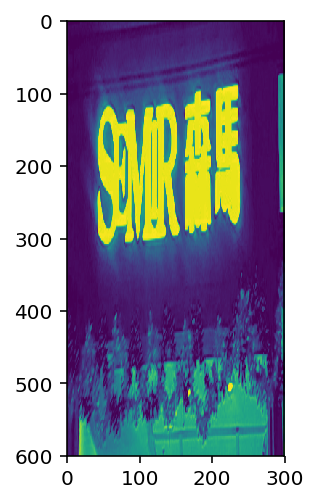

batch 100 [93 93 93 93 93 93 93 93 93 93 93 93 94 94 94 94 94 94 94 94] (20, 600, 300, 3)


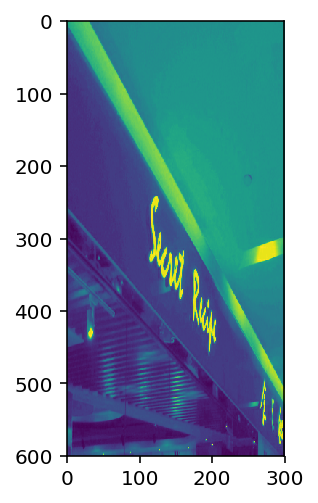

batch 101 [94 94 94 94 94 94 94 94 94 94 94 94 94 95 95 95 95 95 95 95] (20, 600, 300, 3)


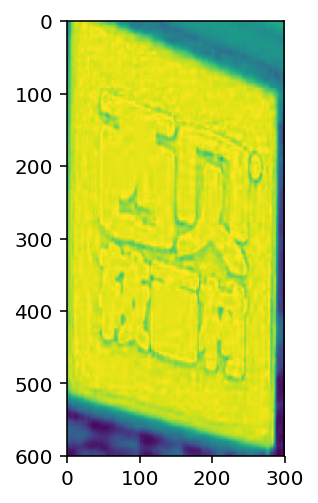

batch 102 [95 95 95 95 95 95 95 95 95 95 95 95 95 95 95 95 95 95 95 95] (20, 600, 300, 3)


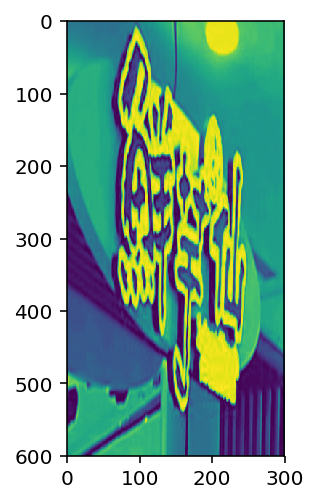

batch 103 [95 95 95 95 95 96 96 96 96 96 96 96 96 96 96 96 96 96 96 96] (20, 600, 300, 3)


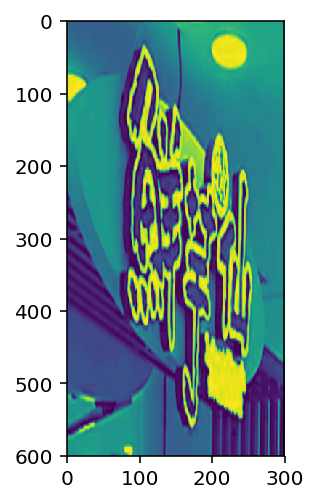

batch 104 [96 96 96 96 96 96 96 96 96 96 96 96 96 96 96 96 96 96 96 96] (20, 600, 300, 3)


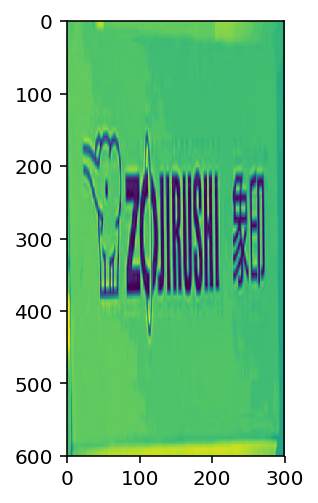

batch 105 [96 96 96 96 96 96 97 97 97 97 97 97 97 97 97 97 97 97 97 97] (20, 600, 300, 3)


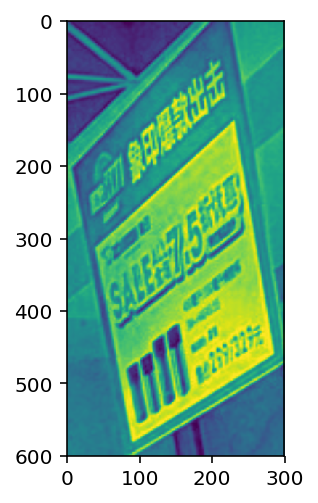

batch 106 [97 97 97 97 97 98 98 98 98 98 98 98 98 98 98 98 98 98 98 98] (20, 600, 300, 3)


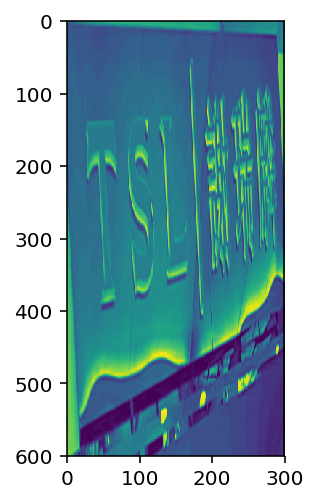

batch 107 [98 98 98 98 98 98 98 98 98 98 98 98 98 98 98 98 98 99 99 99] (20, 600, 300, 3)


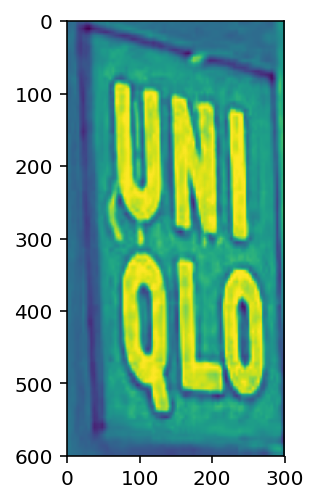

batch 108 [99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99] (20, 600, 300, 3)


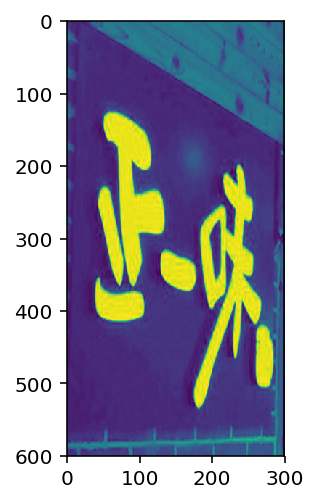

batch 109 [ 99  99  99  99 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 100 100] (20, 600, 300, 3)


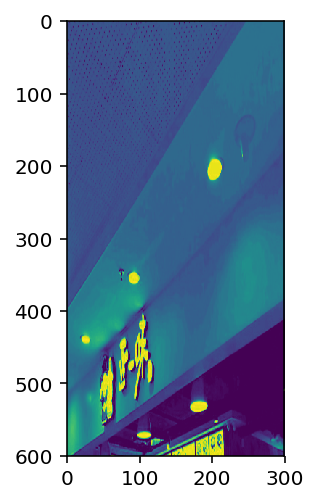

Done training -- epoch limit reached


In [20]:
import matplotlib.pyplot as plt

ep = 0
with tf.Session() as sess:
    ini_op = tf.group(tf.global_variables_initializer(), tf.local_variables_initializer())
    sess.run(ini_op)

    coord = tf.train.Coordinator()
    threads = tf.train.start_queue_runners(coord=coord)

    try:  
        while not coord.should_stop():
            
            x, y_ = sess.run(train_batch)
            #  you can doing sth in there with the batch data x, y_
            ep += 1
            print('batch %s' % ep, y_, x.shape)
            plt.imshow(x[0, :, :, 0])
            plt.show()

#             print(2 / 0)
    except tf.errors.OutOfRangeError:
        print('Done training -- epoch limit reached')  
    finally:  
        coord.request_stop()
    coord.join(threads)

# Keras

In [41]:
datagen = ImageDataGenerator(
            rotation_range=0.2,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest')

In [55]:
global _gen_temp
_gen_temp = 0
sess = tf.Session()

def data_gen(batch_size=128, gene=4):
    global _gen_temp
    while True:
        label_list = yy[_gen_temp * batch_size: min((_gen_temp + 1) * batch_size, len(yy) - 1)]
        file_list = xx[_gen_temp * batch_size: min((_gen_temp + 1) * batch_size, len(xx) - 1)]
        _gen_temp += 1
        
        X_ = []
        for fname in file_list:
            img = cv2.imread(fname)
            img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
            X_.append(img.tolist())
        X_ = np.array(X_)
        y_ = np.array(label_list)
        
        i = 0
        X = None
        y = None
        
        for batch in datagen.flow(X_, y_, batch_size=batch_size):            
            if not type(X) == np.ndarray:
                X = batch[0]
                y = batch[1]
            else:
                X = np.concatenate([X, batch[0]], axis=0)
                y = np.concatenate([y, batch[1]], axis=0)
            
            i += 1
            if i >= gene:
                break
        
        yield np.array(X), np.array(y)

In [56]:
import time
tmp = time.time()
batchdata = next(data_gen(batch_size=128))
print(time.time() - tmp)

42.950504302978516
